# betaseries_analysis
This notebook will use betaseries images to see how the data is organized using independant components analysis.

In [1]:
# don't show warnings
import warnings
warnings.filterwarnings('ignore')
# grabs files based on globbing
from glob import glob
# load nifti files as a python object
import nibabel as nib
# perform dictionary learning
from nilearn.decomposition import DictLearning, CanICA

In [2]:
# setup some initial variables

# the mask for all files
mask = '../group/group_bold_brainmask.nii.gz'
# the betaseries files
#congruent_files = glob('../sub-*/func/sub-*_trialtype-congruent_zscore.nii.gz')
#incongruent_files = glob('../sub-*/func/sub-*_trialtype-incongruent_zscore.nii.gz')
congruent_files = glob('../sub-*/func/sub-*_trialtype-congruent_betaseries.nii.gz')
incongruent_files = glob('../sub-*/func/sub-*_trialtype-incongruent_betaseries.nii.gz')
conditions = {'congruent': congruent_files, 'incongruent': incongruent_files}

In [3]:
# not using this method (probably not enough data)
dict_learning = DictLearning(memory="nilearn_cache", memory_level=2,
                             verbose=1,
                             random_state=0,
                             n_epochs=1,
                             mask=mask)

In [4]:
canica = CanICA(memory="nilearn_cache", memory_level=2,
                threshold=3.,
                n_init=1,
                verbose=1,
                mask=mask)

In [5]:
# nifti_imgs objects in python
components_imgs = []
# written filenames to cache
filenames = []
# estimators = [dict_learning, canica] # dict_learning doesn't work
estimators = [canica]
names = {dict_learning: 'DictionaryLearning', canica: 'CanICA'}
# iterate over different numbers of components to see which fits the data better
n_components_list = [5, 10, 15, 20]

# use the dictionary to access the condition and the betaseries files
for condition, bs_files in conditions.items():
    for estimator in estimators:
        for n_components in n_components_list:
            # set the number of components to estimate
            estimator.n_components = n_components
            print('running {est} for {cond} trials with {n} components'.format(est=names[estimator], cond=condition, n=n_components))
            # fit the betaseries files
            estimator.fit(bs_files)
            masker = estimator.masker_
            # Drop output maps to a Nifti file
            components_img = masker.inverse_transform(estimator.components_)
            # keep track of the filenames
            filename = './.cache/{est}_{cond}_n{n:03d}.nii.gz'.format(est=names[estimator], cond=condition, n=n_components)
            components_img.to_filename(filename)
            filenames.append(filename)
            # keep track of the nifti_imgs
            components_imgs.append(components_img)

running CanICA for congruent trials with 5 components
[MultiNiftiMasker.fit] Loading data from None
[MultiNiftiMasker.transform] Resampling mask
[MultiNiftiMasker.transform_single_imgs] Loading data from Nifti1Image('../sub-26/func/sub-26_trialtype-congruent_betaseries.nii.gz')
[MultiNiftiMasker.transform_single_imgs] Smoothing images
[MultiNiftiMasker.transform_single_imgs] Extracting region signals
[MultiNiftiMasker.transform_single_imgs] Cleaning extracted signals
[MultiNiftiMasker.transform_single_imgs] Loading data from Nifti1Image('../sub-14/func/sub-14_trialtype-congruent_betaseries.nii.gz')
[MultiNiftiMasker.transform_single_imgs] Smoothing images
[MultiNiftiMasker.transform_single_imgs] Extracting region signals
[MultiNiftiMasker.transform_single_imgs] Cleaning extracted signals
[MultiNiftiMasker.transform_single_imgs] Loading data from Nifti1Image('../sub-07/func/sub-07_trialtype-congruent_betaseries.nii.gz')
[MultiNiftiMasker.transform_single_imgs] Smoothing images
[MultiNif

[MultiNiftiMasker.transform_single_imgs] Loading data from Nifti1Image('../sub-16/func/sub-16_trialtype-congruent_betaseries.nii.gz')
[MultiNiftiMasker.transform_single_imgs] Smoothing images
[MultiNiftiMasker.transform_single_imgs] Extracting region signals
[MultiNiftiMasker.transform_single_imgs] Cleaning extracted signals
________________________________________________________________________________
[Memory] Calling sklearn.utils.extmath.randomized_svd...
randomized_svd(array([[ 0.00628 , ..., -0.006618],
       ..., 
       [-0.00041 , ..., -0.004731]]), n_components=5, transpose=True, random_state=None, n_iter=3)
___________________________________________________randomized_svd - 1.3s, 0.0min
________________________________________________________________________________
[Memory] Calling sklearn.decomposition.fastica_.fastica...
fastica(array([[ 0.006847, ..., -0.003884],
       ..., 
       [ 0.002184, ..., -0.00058 ]]), whiten=True, fun='cube', random_state=2000588033)
______

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    7.0s finished


running CanICA for congruent trials with 10 components
[MultiNiftiMasker.fit] Loading data from None
[MultiNiftiMasker.transform] Resampling mask
________________________________________________________________________________
[Memory] Calling sklearn.utils.extmath.randomized_svd...
randomized_svd(array([[ 0.006259, ..., -0.008347],
       ..., 
       [-0.000594, ..., -0.001001]]), n_components=10, transpose=True, random_state=None, n_iter=3)
___________________________________________________randomized_svd - 3.1s, 0.1min
________________________________________________________________________________
[Memory] Calling sklearn.decomposition.fastica_.fastica...
fastica(array([[ 0.006178, ...,  0.005354],
       ..., 
       [ 0.002099, ..., -0.005871]]), whiten=True, fun='cube', random_state=493697221)
__________________________________________________________fastica - 8.5s, 0.1min
________________________________________________________________________________
[Memory] Calling nilearn.

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    8.8s finished


___________________________________________________________unmask - 9.2s, 0.2min
running CanICA for congruent trials with 15 components
[MultiNiftiMasker.fit] Loading data from None
[MultiNiftiMasker.transform] Resampling mask
________________________________________________________________________________
[Memory] Calling sklearn.utils.extmath.randomized_svd...
randomized_svd(array([[ 0.006254, ..., -0.002578],
       ..., 
       [-0.000588, ...,  0.002523]]), n_components=15, transpose=True, random_state=None, n_iter=3)
___________________________________________________randomized_svd - 3.6s, 0.1min
________________________________________________________________________________
[Memory] Calling sklearn.decomposition.fastica_.fastica...
fastica(array([[ 0.006004, ..., -0.001097],
       ..., 
       [ 0.002224, ...,  0.003593]]), whiten=True, fun='cube', random_state=22719459)
__________________________________________________________fastica - 4.9s, 0.1min


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.2s finished


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([[ 0., ...,  0.],
       ..., 
       [ 0., ...,  0.]]), <nibabel.nifti1.Nifti1Image object at 0x7fae09bc6518>)
__________________________________________________________unmask - 17.1s, 0.3min
running CanICA for congruent trials with 20 components
[MultiNiftiMasker.fit] Loading data from None
[MultiNiftiMasker.transform] Resampling mask
________________________________________________________________________________
[Memory] Calling sklearn.utils.extmath.randomized_svd...
randomized_svd(array([[ 0.006254, ..., -0.004398],
       ..., 
       [-0.000588, ..., -0.007831]]), n_components=20, transpose=True, random_state=None, n_iter=3)
___________________________________________________randomized_svd - 4.1s, 0.1min
________________________________________________________________________________
[Memory] Calling sklearn.decomposition.fastica_.fastica...
f

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    6.9s finished


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([[ 0.      , ...,  0.      ],
       ..., 
       [-0.      , ...,  0.019426]]), 
<nibabel.nifti1.Nifti1Image object at 0x7fae09bea390>)
__________________________________________________________unmask - 25.4s, 0.4min
running CanICA for incongruent trials with 5 components
[MultiNiftiMasker.fit] Loading data from None
[MultiNiftiMasker.transform] Resampling mask
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask('../sub-26/func/sub-26_trialtype-incongruent_betaseries.nii.gz', <nibabel.nifti1.Nifti1Image object at 0x7fae48d46be0>, { 'detrend': True,
  'high_pass': None,
  'low_pass': None,
  'smoothing_fwhm': 6,
  'standardize': True,
  't_r': None,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(cachedir='ni

[MultiNiftiMasker.transform_single_imgs] Loading data from Nifti1Image('../sub-04/func/sub-04_trialtype-incongruent_betaseries.nii.gz')
[MultiNiftiMasker.transform_single_imgs] Smoothing images
[MultiNiftiMasker.transform_single_imgs] Extracting region signals
[MultiNiftiMasker.transform_single_imgs] Cleaning extracted signals
__________________________________________________filter_and_mask - 9.1s, 0.2min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask('../sub-09/func/sub-09_trialtype-incongruent_betaseries.nii.gz', <nibabel.nifti1.Nifti1Image object at 0x7fae48d46be0>, { 'detrend': True,
  'high_pass': None,
  'low_pass': None,
  'smoothing_fwhm': 6,
  'standardize': True,
  't_r': None,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(cachedir='nilearn_cache/joblib'), verbose=1, confounds=None, copy=True)
[MultiNiftiMasker.transform_sing

[MultiNiftiMasker.transform_single_imgs] Loading data from Nifti1Image('../sub-06/func/sub-06_trialtype-incongruent_betaseries.nii.gz')
[MultiNiftiMasker.transform_single_imgs] Smoothing images
[MultiNiftiMasker.transform_single_imgs] Extracting region signals
[MultiNiftiMasker.transform_single_imgs] Cleaning extracted signals
_________________________________________________filter_and_mask - 12.0s, 0.2min
________________________________________________________________________________
[Memory] Calling nilearn.input_data.nifti_masker.filter_and_mask...
filter_and_mask('../sub-15/func/sub-15_trialtype-incongruent_betaseries.nii.gz', <nibabel.nifti1.Nifti1Image object at 0x7fae48d46be0>, { 'detrend': True,
  'high_pass': None,
  'low_pass': None,
  'smoothing_fwhm': 6,
  'standardize': True,
  't_r': None,
  'target_affine': None,
  'target_shape': None}, memory_level=1, memory=Memory(cachedir='nilearn_cache/joblib'), verbose=1, confounds=None, copy=True)
[MultiNiftiMasker.transform_sing

___________________________________________________randomized_svd - 1.4s, 0.0min
________________________________________________________________________________
[Memory] Calling sklearn.decomposition.fastica_.fastica...
fastica(array([[ 0.00455 , ...,  0.003733],
       ..., 
       [ 0.003862, ..., -0.008771]]), whiten=True, fun='cube', random_state=1796378232)
__________________________________________________________fastica - 5.9s, 0.1min


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    6.2s finished


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([[-0.002635, ...,  0.00244 ],
       ..., 
       [ 0.00458 , ...,  0.004631]]), 
<nibabel.nifti1.Nifti1Image object at 0x7fae48d46be0>)
___________________________________________________________unmask - 3.9s, 0.1min
running CanICA for incongruent trials with 10 components
[MultiNiftiMasker.fit] Loading data from None
[MultiNiftiMasker.transform] Resampling mask
________________________________________________________________________________
[Memory] Calling sklearn.utils.extmath.randomized_svd...
randomized_svd(array([[ 0.003853, ..., -0.005197],
       ..., 
       [ 0.001378, ...,  0.002708]]), n_components=10, transpose=True, random_state=None, n_iter=3)
___________________________________________________randomized_svd - 2.3s, 0.0min
________________________________________________________________________________
[Memory] Calling sklearn.decompos

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   11.5s finished


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([[-0.      , ..., -0.      ],
       ..., 
       [-0.005325, ...,  0.      ]]), 
<nibabel.nifti1.Nifti1Image object at 0x7fae46385fd0>)
___________________________________________________________unmask - 9.1s, 0.2min
running CanICA for incongruent trials with 15 components
[MultiNiftiMasker.fit] Loading data from None
[MultiNiftiMasker.transform] Resampling mask
________________________________________________________________________________
[Memory] Calling sklearn.utils.extmath.randomized_svd...
randomized_svd(array([[ 0.003854, ...,  0.003994],
       ..., 
       [ 0.001382, ..., -0.000113]]), n_components=15, transpose=True, random_state=None, n_iter=3)
___________________________________________________randomized_svd - 3.4s, 0.1min
________________________________________________________________________________
[Memory] Calling sklearn.decompos

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   14.7s finished


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([[ 0., ...,  0.],
       ..., 
       [-0., ..., -0.]]), <nibabel.nifti1.Nifti1Image object at 0x7fae09beae48>)
__________________________________________________________unmask - 17.1s, 0.3min
running CanICA for incongruent trials with 20 components
[MultiNiftiMasker.fit] Loading data from None
[MultiNiftiMasker.transform] Resampling mask
________________________________________________________________________________
[Memory] Calling sklearn.utils.extmath.randomized_svd...
randomized_svd(array([[ 0.003854, ..., -0.001114],
       ..., 
       [ 0.001382, ...,  0.002132]]), n_components=20, transpose=True, random_state=None, n_iter=3)
___________________________________________________randomized_svd - 4.5s, 0.1min
________________________________________________________________________________
[Memory] Calling sklearn.decomposition.fastica_.fastica...

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.9s finished


________________________________________________________________________________
[Memory] Calling nilearn.masking.unmask...
unmask(array([[ 0.007651, ...,  0.      ],
       ..., 
       [ 0.00919 , ..., -0.      ]]), 
<nibabel.nifti1.Nifti1Image object at 0x7fae09beac50>)
__________________________________________________________unmask - 25.5s, 0.4min


In [6]:
# or if the files already exist
try:
  filenames
except NameError:
  filenames = glob('./.cache/CanICA_*.nii.gz')
filenames

['./.cache/CanICA_congruent_n005.nii.gz',
 './.cache/CanICA_congruent_n010.nii.gz',
 './.cache/CanICA_congruent_n015.nii.gz',
 './.cache/CanICA_congruent_n020.nii.gz',
 './.cache/CanICA_incongruent_n005.nii.gz',
 './.cache/CanICA_incongruent_n010.nii.gz',
 './.cache/CanICA_incongruent_n015.nii.gz',
 './.cache/CanICA_incongruent_n020.nii.gz']

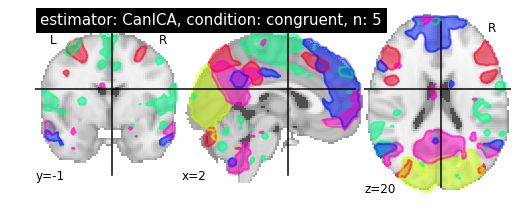

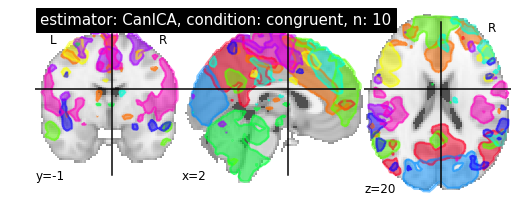

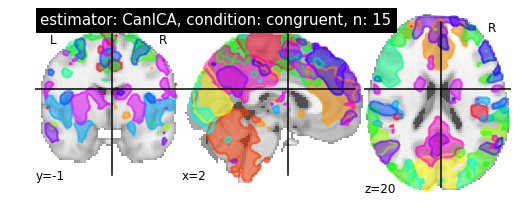

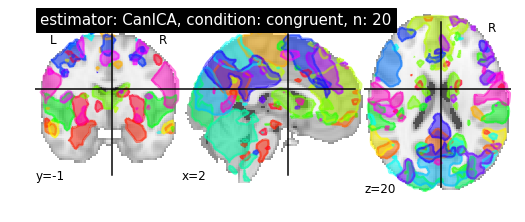

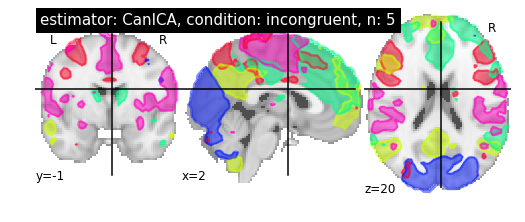

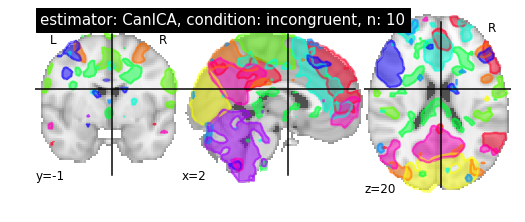

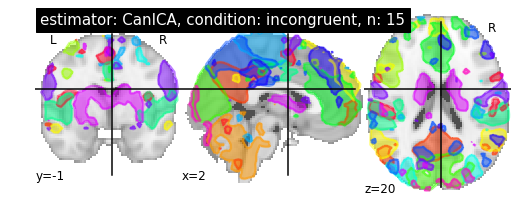

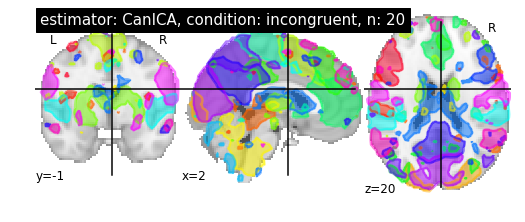

In [7]:
# Visualization of betaseries networks
# Show networks using plotting utilities
%matplotlib inline
from nilearn import plotting
from niwidgets import NiftiWidget
# iterate over component images
i = 0
# keep track of the widgets (not working right now)
ica_widgets = {}
for condition in conditions:
    for estimator in estimators:
        for num in n_components_list:
        
            plotting.plot_prob_atlas(components_imgs[i], view_type='filled_contours',
                                     title='estimator: {est}, condition: {cond}, n: {n}'.format(est=names[estimator], cond=condition, n=num))
           
            ica_widgets['{est}_{cond}_comp-{num:03d}'.format(cond=condition, num=num, est=names[estimator])] =  NiftiWidget(filenames[i])
            #ica_widgets['{est}_{cond}_comp-{num:03d}'.format(cond=condition, num=num, est=names[estimator])].nifti_plotter(plotting_func=plot_stat_map, display_mode=['ortho', 'x', 'y', 'z', 't', 'yx', 'xz', 'yz'],
            #                                                                                          title = '{est}_{cond}_comp-{num:03d}'.format(cond=condition, num=num, est=names[estimator]))
            
            i += 1

In [8]:
# just plot the CanICA components interactively
from nilearn.image import iter_img
from nilearn.plotting import plot_stat_map, show
from niwidgets import NiftiWidget
nii_widgets = {}
j = 0
# this displays the images in a different order than how they are stored on the disk, annoying...
for condition in conditions:
    for n in n_components_list:
        for i, cur_img in enumerate(iter_img(components_imgs[j])):
            comp_filename = '.cache/component_imgs/{cond}_comp-{n:03d}_{i:03d}.nii.gz'.format(cond=condition, n=n, i=i)
            cur_img.to_filename(comp_filename)
            nii_widgets['{cond}_comp-{n:03d}_{i:03d}'.format(cond=condition, n=n, i=i)] = NiftiWidget(comp_filename)
            nii_widgets['{cond}_comp-{n:03d}_{i:03d}'.format(cond=condition, n=n, i=i)].nifti_plotter(plotting_func=plot_stat_map, display_mode=['ortho', 'x', 'y', 'z', 'yx', 'xz', 'yz'],
                                                                                                      title = '{cond}_comp-{n:03d}_{i:03d}'.format(cond=condition, n=n, i=i))
        j += 1



A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

A Jupyter Widget

In [10]:

from nilearn import datasets
from nilearn.image import resample_to_img, resample_img, threshold_img
# get the smith maps
smith_maps = datasets.fetch_atlas_smith_2009(data_dir='./.cache')
rsn20_img = nib.load(smith_maps['rsn20'])
# set the file for congruent components
comps_con = filenames[3]
# set the file for incongruent components
comps_inc = filenames[7]
# load the files into a python object
comps_con_img = nib.load(comps_con)
comps_inc_img = nib.load(comps_inc)

# resample the smith maps into the bold voxel space
display(rsn20_img.shape)
rsn20_img = resample_to_img(rsn20_img, comps_con_img)
display(rsn20_img.shape)
rsn20_img = threshold_img(rsn20_img, 0.0001)

# write the resampled smith rsn20 map onto disk
rsn20_file = './.cache/smith_map_rsn20.nii.gz'
rsn20_img.to_filename(rsn20_file)

(91, 109, 91, 20)

(65, 77, 49, 20)

In [11]:
%%bash -s "$rsn20_file" "$comps_con" "$comps_inc"
rsn20_file=$1
comps_con=$2
comps_inc=$3
# smith map numbers
# 12: left fronto-parietal
# 13: right fronto-parietal
# 8: executive network
echo "rsns compared to incongruent networks"
fslcc --noabs $rsn20_file $comps_inc
# results:
# incongruent
# 8: left fronto-parietal 0.51
# 9: right fronto-parietal 0.44
# 12: executive network 0.42
echo -e "\n"
echo "rsns compared to congruent networks"
fslcc --noabs $rsn20_file $comps_con
# results
# congruent
# 6: left fronto-parietal 0.48
# 8: right fronto-parietal 0.48
# 19: executive network 0.42
echo -e "\n"
echo "incongruent networks compared to congruent networks"
fslcc --noabs $comps_inc $comps_con
# results
# inc 8 == con 6 0.68
# inc 9 == con 8 0.67
# inc 12 == con 19 0.66

rsns compared to incongruent networks
  1   7 0.13
  1  14 0.28
  2   2 0.30
  2   6 0.17
  2  11 0.19
  2  12 0.12
  2  19 0.28
  3   7 0.21
  3  12 0.52
  3  19 0.11
  3  20 0.29
  4   3 0.16
  4   5 0.12
  4   7 0.20
  4   9 0.11
  4  10 0.11
  5   5 0.16
  5   9 0.11
  6  18 0.76
  7  10 0.20
  7  16 0.67
  7  20 0.17
  8   6 0.15
  8   7 0.21
  8   8 0.16
  8  10 0.35
  9   5 0.36
  9   9 0.10
  9  13 0.23
 10   2 0.15
 10   4 0.28
 10   9 0.41
 10  13 0.12
 10  15 0.13
 10  20 0.13
 11  20 0.33
 12   1 0.53
 12   2 0.19
 12  20 0.10
 13   8 0.41
 13  12 0.11
 13  15 0.28
 13  20 0.14
 14  10 0.14
 14  15 0.12
 15   2 0.12
 15  17 0.45
 16   4 0.62
 17   1 0.11
 17   9 0.24
 17  11 0.11
 17  15 0.37
 17  16 0.18
 17  17 0.16
 18   4 0.18
 18   9 0.15
 18  17 0.11
 18  18 0.29
 19   2 0.13
 19  11 0.43
 19  19 0.10
 20  13 0.12
 20  17 0.16


rsns compared to congruent networks
  1  16 0.11
  2   4 0.27
  2   9 0.11
  2  16 0.11
  2  19 0.37
  2  20 0.20
  3   1 0.13
  3   5 0.24
 

## results
all using the 20 component model

**WARNING**: the interactive niwidget displays are in a different order than the nifti files, so look at the component nifti files to match the networks between smith and these maps. These networks are reported with a count starting at *1* instead of *0*, so be aware when looking for these volumes in an image viewer that begins at index *0* (subtract one from each listed number)
- DMN
    - incongruent
        - 05*
    - congruent
        - 18*
        - 05*
- frontoparietal network
    - incongruent
        - 8 (right)
        - 9 (left)
    - congruent
        - 6 (right)
        - 8 (left)
- cingulo-opercular network (more like the executive network)
    - incongruent
        - 12
    - congruent
        - 19
 
\* Need to deal with ordering issue with niwidgets to confirm the correct volume numbers
## Conclusions
* The cingulo-opercular network was clearly visible in congruent and incongruent conditions.
* The fronto-parietal network was more delineated in the incongruent condition, I couldn't find good separate left and right components in the congruent condition.

## Future directions?
* try combining congruent and incongruent trials into one ICA run, and then run dual_regression
* extract rois for seeding from the above specified networks.